# **Load Packages** 

In [1]:
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')

pd.set_option("display.max_columns", None)

# Import dataset 

In [2]:
data = pd.read_csv(
    "data_science_competition_2024.csv"
)
data.head(2)

,loan_id,gender,disbursemet_date,currency,country,sex,is_employed,job,location,loan_amount,number_of_defaults,outstanding_balance,interest_rate,age,number_of_defaults.1,remaining term,salary,marital_status,age.1,Loan Status
0,8d05de78-ff32-46b1-aeb5-b3190f9c158a,female,2022 10 29,USD,Zimbabwe,female,True,Teacher,Beitbridge,39000,0,48653.01147,0.22,37,0,47,3230.038869,married,37,Did not default
1,368bf756-fcf2-4822-9612-f445d90b485b,other,2020 06 06,USD,Zimbabwe,other,True,Teacher,Harare,27000,2,28752.06224,0.20,43,2,62,3194.139103,single,43,Did not default


In [3]:
data.columns

Index(['loan_id', 'gender', 'disbursemet_date', 'currency', 'country', 'sex',
       'is_employed', 'job', 'location', 'loan_amount', 'number_of_defaults',
       'outstanding_balance', 'interest_rate', 'age', 'number_of_defaults.1',
       'remaining term', 'salary', 'marital_status', 'age.1', 'Loan Status'],
      dtype='object')

In [4]:
data.columns = data.columns.str.strip().str.replace(" ", "_")
data.head(2)

,loan_id,gender,disbursemet_date,currency,country,sex,is_employed,job,location,loan_amount,number_of_defaults,outstanding_balance,interest_rate,age,number_of_defaults.1,remaining_term,salary,marital_status,age.1,Loan_Status
0,8d05de78-ff32-46b1-aeb5-b3190f9c158a,female,2022 10 29,USD,Zimbabwe,female,True,Teacher,Beitbridge,39000,0,48653.01147,0.22,37,0,47,3230.038869,married,37,Did not default
1,368bf756-fcf2-4822-9612-f445d90b485b,other,2020 06 06,USD,Zimbabwe,other,True,Teacher,Harare,27000,2,28752.06224,0.20,43,2,62,3194.139103,single,43,Did not default


# **Exploratory Data Analysis**

In [5]:
data.describe()

,loan_amount,number_of_defaults,outstanding_balance,interest_rate,age,number_of_defaults.1,salary,age.1
count,100000.000000,100000.000000,100000.000000,100000.000000,100000.00000,100000.000000,100000.000000,100000.00000
mean,31120.000000,0.441970,36964.909763,0.210435,43.57069,0.441970,2781.804324,43.57069
std,15895.093631,0.688286,10014.758477,0.018725,4.86376,0.688286,696.450055,4.86376
min,1000.000000,0.000000,0.000000,0.100000,21.00000,0.000000,250.000000,21.00000
25%,21000.000000,0.000000,29625.227473,0.200000,40.00000,0.000000,2273.929349,40.00000
50%,31000.000000,0.000000,35063.852395,0.210000,44.00000,0.000000,2665.441568,44.00000
75%,40000.000000,1.000000,42133.388820,0.220000,47.00000,1.000000,3146.577655,47.00000
max,273000.000000,2.000000,150960.000000,0.300000,65.00000,2.000000,10000.000000,65.00000


In [6]:
data.shape

(100000, 20)

In [7]:
def preprocessing_data(data:pd.DataFrame)->pd.DataFrame:
    data["remaining_term"] = data["remaining_term"].str.split("_").str.get(0)
    data["remaining_term"] = pd.to_numeric(data["remaining_term"], errors="coerce")
    data['country'] = data['country'].str.lower().replace({'zim': 'zimbabwe'})
    data['currency'] = data['currency'].replace({'\$USD': 'USD'}, regex=True)
    return data

##### *Check missing values*

In [8]:
def check_missing_value(df: pd.DataFrame) -> pd.DataFrame:
    missing_values_count = data.isnull().sum()
    columns_with_missing_values = missing_values_count[missing_values_count > 0]
    data_missing_values = pd.DataFrame(columns_with_missing_values).reset_index()
    data_missing_values.columns = ["Column", "Count of Missing Values"]
    return data_missing_values

In [9]:
check_missing_value = check_missing_value(data)
check_missing_value

,Column,Count of Missing Values
0,country,100
1,job,4136
2,location,595


From the data, we can see that there are missing values as follows:

- **Country**: 100 missing values
- **Job**: 4,136 missing values
- **Location**: 595 missing values


## Handling Missing Values with Most Frequent Value

In this method, we fill missing values in specified columns with the most frequent value (mode) for each column. The steps involved are as follows:

1. **Specify Columns to Fill**:
   - We select the columns where missing values need to be filled. In this case, the columns are `['country', 'job', 'location']`.

2. **Calculate Mode for Each Column**:
   - For each column in the list, compute the most frequent value (mode) using `data[column].mode()[0]`.

3. **Fill Missing Values**:
   - Replace missing values in each column with the computed mode using `data[column].fillna(mode_value, inplace=True)`.


In [10]:
columns_to_fill = ["country", "job", "location"]
for column in columns_to_fill:
    mode_value = data[column].mode()[0]
    data[column].fillna(mode_value, inplace=True)

#### *Check Duplicates*

In [11]:
def check_duplicates(df: pd.DataFrame) -> pd.DataFrame:
    duplicates = df[df.duplicated(keep=False)]
    return duplicates.sort_values(by="loan_id")

In [12]:
check_duplicates = check_duplicates(data)
check_duplicates

,loan_id,gender,disbursemet_date,currency,country,sex,is_employed,job,location,loan_amount,number_of_defaults,outstanding_balance,interest_rate,age,number_of_defaults.1,remaining_term,salary,marital_status,age.1,Loan_Status


From the data, we can see that there are no duplicate values

##### *Convert dates columns*

In [13]:
dates_columns = data.filter(regex="date").columns

In [14]:
data.shape

(100000, 20)

In [15]:
data.columns

Index(['loan_id', 'gender', 'disbursemet_date', 'currency', 'country', 'sex',
       'is_employed', 'job', 'location', 'loan_amount', 'number_of_defaults',
       'outstanding_balance', 'interest_rate', 'age', 'number_of_defaults.1',
       'remaining_term', 'salary', 'marital_status', 'age.1', 'Loan_Status'],
      dtype='object')

In [16]:
for column in dates_columns:
    data[column] = pd.to_datetime(data[column], errors="coerce")

In [17]:
not_converted_dates = data[data[dates_columns].isna().any(axis=1)]
not_converted_dates

,loan_id,gender,disbursemet_date,currency,country,sex,is_employed,job,location,loan_amount,number_of_defaults,outstanding_balance,interest_rate,age,number_of_defaults.1,remaining_term,salary,marital_status,age.1,Loan_Status


- As we can see, all dates have been successfully converted to datetime format.

### *Drop unnecessary columns because these columns are duplicated.*

In [18]:
# data['number_of_defaults']-data['number_of_defaults.1']
# data['age.1']-data['age']

In [19]:
data.drop(columns=["age.1", "number_of_defaults.1", "sex"], axis=1, inplace=True)

In [20]:
data.head(2)

,loan_id,gender,disbursemet_date,currency,country,is_employed,job,location,loan_amount,number_of_defaults,outstanding_balance,interest_rate,age,remaining_term,salary,marital_status,Loan_Status
0,8d05de78-ff32-46b1-aeb5-b3190f9c158a,female,2022-10-29,USD,Zimbabwe,True,Teacher,Beitbridge,39000,0,48653.01147,0.22,37,47,3230.038869,married,Did not default
1,368bf756-fcf2-4822-9612-f445d90b485b,other,2020-06-06,USD,Zimbabwe,True,Teacher,Harare,27000,2,28752.06224,0.20,43,62,3194.139103,single,Did not default


In [21]:
data.describe().T


,count,mean,min,25%,50%,75%,max,std
disbursemet_date,100000,2021-12-31 22:15:44.640000256,2020-01-01 00:00:00,2021-01-01 00:00:00,2021-12-31 00:00:00,2022-12-31 00:00:00,2023-12-31 00:00:00,NaN
loan_amount,100000.0,31120.0,1000.0,21000.0,31000.0,40000.0,273000.0,15895.093631
number_of_defaults,100000.0,0.44197,0.0,0.0,0.0,1.0,2.0,0.688286
outstanding_balance,100000.0,36964.909763,0.0,29625.227473,35063.852395,42133.38882,150960.0,10014.758477
interest_rate,100000.0,0.210435,0.1,0.2,0.21,0.22,0.3,0.018725
age,100000.0,43.57069,21.0,40.0,44.0,47.0,65.0,4.86376
salary,100000.0,2781.804324,250.0,2273.929349,2665.441568,3146.577655,10000.0,696.450055


In [22]:
import matplotlib.pyplot as plt
import plotly.express as px

In [23]:
data['job'] = data['job'].replace({'SoftwareDeveloper': 'Software Developer'})


In [24]:
data['job'].value_counts()

job
Engineer              20660
Software Developer    15496
Nurse                 15284
Data Analyst          13204
Doctor                12186
Teacher                8950
Accountant             7802
Data Scientist         3521
Lawyer                 2862
Data Scintist            35
Name: count, dtype: int64

In [25]:
data.head(3)

,loan_id,gender,disbursemet_date,currency,country,is_employed,job,location,loan_amount,number_of_defaults,outstanding_balance,interest_rate,age,remaining_term,salary,marital_status,Loan_Status
0,8d05de78-ff32-46b1-aeb5-b3190f9c158a,female,2022-10-29,USD,Zimbabwe,True,Teacher,Beitbridge,39000,0,48653.01147,0.22,37,47,3230.038869,married,Did not default
1,368bf756-fcf2-4822-9612-f445d90b485b,other,2020-06-06,USD,Zimbabwe,True,Teacher,Harare,27000,2,28752.06224,0.20,43,62,3194.139103,single,Did not default
2,6e3be39e-49b5-45b5-aab6-c6556de53c6f,other,2023-09-29,USD,Zimbabwe,True,Nurse,Gweru,35000,1,44797.55413,0.22,43,57,3330.826656,married,Did not default


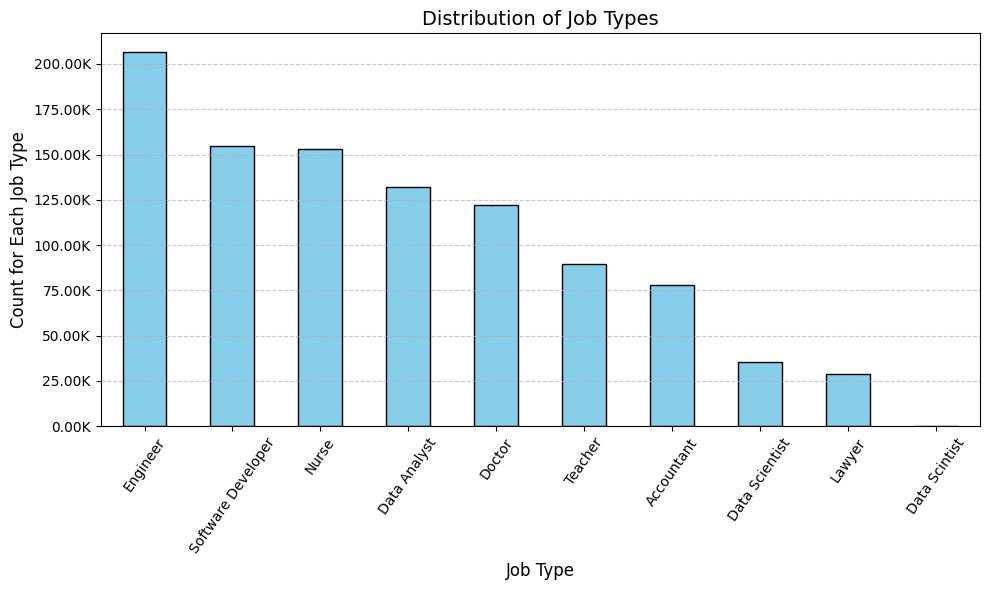

In [26]:
ax0 = (
    data["job"]
    .value_counts()
    .plot(
        kind="bar",
        figsize=(10, 6),
        color="skyblue",
        edgecolor="black",
        ylabel="Count for Each Job Type",
        xlabel="Job Type",
        title="Distribution of Job Types",
    )
)
ax0.yaxis.set_major_formatter(lambda x, p: "{:,.2f}K".format(x * 1e-2))
ax0.xaxis.set_tick_params(rotation=55, labelsize=10)
ax0.yaxis.grid(True, alpha=0.7, linestyle="--")
ax0.set_title("Distribution of Job Types", fontsize=14)
ax0.set_xlabel("Job Type", fontsize=12)
ax0.set_ylabel("Count for Each Job Type", fontsize=12)
plt.tight_layout()
plt.show()

- Dominance of Engineers and Healthcare Professionals: The dominance of engineers and nurses in the histogram indicates that these job types represent the largest groups of loan borrowers.
- Lawyers and Data Scintist: These job types highlight that they borrow less frequently.

In [27]:
groupby_category = (
    data.groupby("job")["outstanding_balance"]
    .agg("sum")
    .reset_index(name="Total Amount of Outstanding")
)
fig = px.bar(
    data_frame=groupby_category,
    x="job",
    y="Total Amount of Outstanding",
    title="Total Outstanding Loan Amount by Job Type",
    labels={
        "job": "Job Type",
        "Total Amount of Outstanding": "Total Outstanding Amount",
    },
    color="Total Amount of Outstanding",
    color_continuous_scale="Viridis",
)
fig.update_layout(
    xaxis_title="Job Type",
    yaxis_title="Total Outstanding Amount",
    xaxis_tickangle=-45,
    template="plotly_white",
    title={
        "text": "Total Outstanding Loan Amount by Job Type",
        "y": 0.9,
        "x": 0.5,
        "xanchor": "center",
        "yanchor": "top",
    },
)
fig.show()

In [28]:
groupby_category = (
    data.groupby("job")[["outstanding_balance", "loan_amount"]].agg("sum").reset_index()
)
groupby_category_melted = groupby_category.melt(
    id_vars="job",
    value_vars=["outstanding_balance", "loan_amount"],
    var_name="Metric",
    value_name="Amount",
)
fig = px.bar(
    data_frame=groupby_category_melted,
    x="job",
    y="Amount",
    color="Metric",
    barmode="group",
    title="Total Outstanding Loan Amount and Loan Amount by Job Type",
    labels={"job": "Job Type", "Amount": "Total Amount"},
    color_discrete_map={"outstanding_balance": "blue", "loan_amount": "green"},
)

fig.update_layout(
    xaxis_title="Job Type",
    yaxis_title="Total Amount",
    xaxis_tickangle=-45,
    template="plotly_white",
    title={
        "text": "Total Outstanding Loan Amount and Loan Amount by Job Type",
        "y": 0.9,
        "x": 0.5,
        "xanchor": "center",
        "yanchor": "top",
    },
)
fig.show()

## Key Observations

- **Engineer**: Engineers have the highest outstanding balance and total loan amount, indicating that they are the largest group of borrowers in terms of both metrics.
  - Outstanding Balance: 750,893,500
  - Loan Amount: 618,112,500

- **Nurse**: Nurses follow engineers, showing significant totals in both outstanding balances and loan amounts.
  - Outstanding Balance: 560,377,600
  - Loan Amount: 464,149,500

- **Data Analyst**: Data Analysts have a high presence among borrowers with substantial outstanding balances and loan amounts.
  - Outstanding Balance: 501,030,300
  - Loan Amount: 444,037,000

- **Doctor**: Doctors show strong borrowing activity with high totals in both metrics.
  - Outstanding Balance: 435,815,200
  - Loan Amount: 343,735,000

- **Software Developer**: This job type has a considerable outstanding balance and loan amount, reflecting significant borrowing activity.
  - Outstanding Balance: 426,743,900
  - Loan Amount: 338,695,500

- **Teacher**: Teachers also represent a meaningful portion of the dataset with notable totals.
  - Outstanding Balance: 352,992,600
  - Loan Amount: 337,743,000

- **Accountant**: Accountants show moderate borrowing activity with substantial totals in both metrics.
  - Outstanding Balance: 276,151,900
  - Loan Amount: 215,025,500

- **SoftwareDeveloper**: Despite being a variation of "Software Developer," this group shows significant borrowing, although less than the standard "Software Developer" category.
  - Outstanding Balance: 126,908,200
  - Loan Amount: 100,837,500

- **Data Scientist**: Data Scientists have moderate totals in both outstanding balances and loan amounts.
  - Outstanding Balance: 142,941,600
  - Loan Amount: 144,379,500

- **Lawyer**: Lawyers show lower borrowing totals, indicating they are less frequent borrowers compared to other job types.
  - Outstanding Balance: 99,925,450
  - Loan Amount: 74,455,500

- **Data Scintist**: This appears to be a typographical error with very low values, suggesting minimal impact on overall analysis.
  - Outstanding Balance: 1,352,632
  - Loan Amount: 1,161,000

## Key Insights

- **High Borrowing Professions**: Engineers, nurses, data analysts, and doctors are among the highest borrowers in terms of both total outstanding loan amount and loan amount.

This analysis provides a comprehensive overview of borrowing patterns by job type, offering valuable insights for financial decision-making and policy development.


In [29]:
location_counts = data["location"].value_counts().reset_index()
location_counts.columns = ["location", "count"]
top_15_locations = location_counts.head(15)

In [30]:
fig = px.bar(
    data_frame=top_15_locations,
    x="location",
    y="count",
    title="Top 15 Locations with the Highest Number of Borrowers",
    labels={"location": "Location", "count": "Number of Borrowers"},
    color="count",
    color_continuous_scale="Viridis",
)

fig.update_layout(
    xaxis_title="Location",
    yaxis_title="Number of Borrowers",
    xaxis_tickangle=-45,
    template="plotly_white",
    title={
        "text": "Top 15 Locations with the Highest Number of Borrowers",
        "y": 0.9,
        "x": 0.5,
        "xanchor": "center",
        "yanchor": "top",
    },
)
fig.show()


## Key Observations
The Histogram above shows the top 15 locations with the highest number of borrowers:

- **Harare**: Harare is the location with the highest number of borrowers, totaling 8,933. This indicates a strong borrowing presence in the capital city, likely due to its large population and economic activity.

- **Bulawayo**: The second-highest number of borrowers is in Bulawayo, with 8,078. As the second-largest city in Zimbabwe, it reflects significant borrowing activity.

- **Mutare**: With 8,062 borrowers, Mutare ranks closely with Bulawayo, showing substantial borrowing in this city.

- **Gweru**: Gweru follows with 7,803 borrowers. It is a major city in central Zimbabwe, contributing to a considerable number of borrowers.

- **Masvingo**: Masvingo has 7,476 borrowers, indicating a robust borrowing presence in this city.

- **Marondera**: Marondera shows a significant number of borrowers with 7,343, reflecting its role as a key regional center.

- **Rusape**: Rusape, with 6,378 borrowers, contributes to the high borrowing activity in the eastern part of Zimbabwe.

- **Chivhu**: Chivhu has 6,257 borrowers, adding to the regional borrowing activity.

- **Plumtree**: Plumtree, located in the southwestern part of Zimbabwe, has 5,431 borrowers.
- **Beitbridge**: Beitbridge, a border town, has 5,181 borrowers, showing a notable borrowing presence despite its smaller size compared to other cities.


In [31]:
fig5 = px.scatter(
    data_frame=data,
    x="salary",
    y="outstanding_balance",
    title="Salary vs Outstanding Balance",
    labels={"salary": "Salary", "outstanding_balance": "Outstanding Balance"},
    color="job",
    size="loan_amount",
    hover_data=["loan_id", "job"],
    template="plotly_white",
)

fig5.update_layout(
    xaxis_title="Salary",
    yaxis_title="Outstanding Balance",
    title={
        "text": "Salary vs Outstanding Balance",
        "y": 0.9,
        "x": 0.5,
        "xanchor": "center",
        "yanchor": "top",
    },
)
fig5.show()

In [32]:
fig4 = px.box(
    data_frame=data,
    x="gender",
    y="loan_amount",
    title="Loan Amount by Gender",
    labels={"gender": "Gender", "loan_amount": "Loan Amount"},
    color="gender",
    color_discrete_sequence=px.colors.qualitative.Set3,
)

fig4.update_layout(template="plotly_white")
fig4.show()

# Summary of Loan Amount Distribution by Gender

## 1. Female

- **Q1 (First Quartile)**: ~19K
  - **Description**: This is the 25th percentile of the loan amounts for females, indicating that 25% of female borrowers have loan amounts less than or equal to 19K.
  
- **Median**: ~34K
  - **Description**: This is the middle value of loan amounts for females, meaning 50% of female borrowers have loan amounts less than or equal to 34K.
  
- **Q3 (Third Quartile)**: ~43K
  - **Description**: This is the 75th percentile, indicating that 75% of female borrowers have loan amounts less than or equal to 43K.

## 2. Male

- **Q1 (First Quartile)**: ~19K
  - **Description**: Similar to females, 25% of male borrowers have loan amounts less than or equal to 19K.
  
- **Median**: ~27K
  - **Description**: The median loan amount for males is 27K, which is lower than the median for females. This suggests that, on average, male borrowers have lower loan amounts compared to female borrowers.
  
- **Q3 (Third Quartile)**: ~40K
  - **Description**: The 75th percentile for males is 40K, indicating that 75% of male borrowers have loan amounts less than or equal to 40K.

## 3. Other

- **Q1 (First Quartile)**: ~25K
  - **Description**: 25% of borrowers in the "Other" category have loan amounts less than or equal to 25K.
  
- **Median**: ~32K
  - **Description**: The median loan amount for "Other" borrowers is 32K, which is between the median values of female and male borrowers.
  
- **Q3 (Third Quartile)**: ~38K
  - **Description**: 75% of "Other" borrowers have loan amounts less than or equal to 38K.

In [33]:
fig2 = px.pie(
    data_frame=data,
    names="Loan_Status",
    title="Distribution of Loan Status",
    color_discrete_sequence=px.colors.sequential.RdBu,
)

fig2.update_traces(textposition="inside", textinfo="percent+label")
fig2.update_layout(template="plotly_white")
fig2.show()

- The distribution of loan status shows that 14.9% of loans are in default, while 85.1% are non-default loans. This indicates that the data is imbalanced.


In [34]:
fig3 = px.histogram(
    data_frame=data,
    x="age",
    nbins=20,
    title="Age Distribution of Borrowers",
    labels={"age": "Age"},
    color_discrete_sequence=["#636EFA"],
)

fig3.update_layout(
    xaxis_title="Age",
    yaxis_title="Count",
    template="plotly_white",
    title={
        "text": "Age Distribution of Borrowers",
        "y": 0.9,
        "x": 0.5,
        "xanchor": "center",
        "yanchor": "top",
    },
)
fig3.show()

- The age distribution of borrowers appears to follow a normal distribution. Notably, the age group 42-46 has the highest number of borrowers.

In [35]:
data.head(2)

,loan_id,gender,disbursemet_date,currency,country,is_employed,job,location,loan_amount,number_of_defaults,outstanding_balance,interest_rate,age,remaining_term,salary,marital_status,Loan_Status
0,8d05de78-ff32-46b1-aeb5-b3190f9c158a,female,2022-10-29,USD,Zimbabwe,True,Teacher,Beitbridge,39000,0,48653.01147,0.22,37,47,3230.038869,married,Did not default
1,368bf756-fcf2-4822-9612-f445d90b485b,other,2020-06-06,USD,Zimbabwe,True,Teacher,Harare,27000,2,28752.06224,0.20,43,62,3194.139103,single,Did not default


In [36]:
data["Loan_Status"].value_counts()

Loan_Status
Did not default    85134
Defaulted          14866
Name: count, dtype: int64

In [37]:
def converting_loan_status_column(data):
    mapping = {"Did not default": 0, "Defaulted": 1}
    data["Loan_Status"] = data["Loan_Status"].map(mapping)
    return data

In [38]:
data = converting_loan_status_column(data)

- **Label encoding** is a technique used to convert categorical values into numerical values. Each unique category is assigned a unique integer

# Feature Selection and Model Training

In [2]:
import pandas as pd
import numpy as np
from sklearn import ensemble, linear_model, neighbors, svm
from sklearn.preprocessing import MinMaxScaler, LabelEncoder
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    roc_auc_score, accuracy_score, recall_score, precision_score, f1_score
)
from sklearn.impute import SimpleImputer
import xgboost as xgb

In [52]:
categorical_columns = ['gender', 'country', 'is_employed', 'job', 'location', 'marital_status', 'currency']
numeric_columns = ['loan_amount', 'number_of_defaults', 'outstanding_balance', 'interest_rate', 'age', 'remaining_term', 'salary']

for col in numeric_columns:
    data[col] = data[col].astype(str).str.replace(',', '', regex=False).str.replace('_', '', regex=False)
    data[col] = pd.to_numeric(data[col], errors='coerce')


for col in categorical_columns:
    data[col] = data[col].astype(str).str.strip()

In [53]:
class CapOutliers(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        self.columns = [f"col{i}" for i in range(X.shape[1])]
        X_df = pd.DataFrame(X, columns=self.columns)
        self.bounds_ = {
            col: (
                X_df[col].quantile(0.25) - 1.5 * (X_df[col].quantile(0.75) - X_df[col].quantile(0.25)),
                X_df[col].quantile(0.75) + 1.5 * (X_df[col].quantile(0.75) - X_df[col].quantile(0.25))
            )
            for col in self.columns
        }
        return self

    def transform(self, X):
        X_df = pd.DataFrame(X, columns=self.columns)
        for col in self.columns:
            lower, upper = self.bounds_[col]
            X_df[col] = X_df[col].clip(lower=lower, upper=upper)
        return X_df.values

In [54]:
class LabelEncoderTransformer(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        self.columns = [f"col{i}" for i in range(X.shape[1])]
        X_df = pd.DataFrame(X, columns=self.columns)
        self.label_encoders = {}
        self.classes_ = {}

        for col in self.columns:
            le = LabelEncoder()
            le.fit(X_df[col])
            self.label_encoders[col] = le
            self.classes_[col] = set(le.classes_)
        return self

    def transform(self, X):
        X_df = pd.DataFrame(X, columns=self.columns)
        for col in self.columns:
            X_df[col] = X_df[col].apply(lambda x: self.label_encoders[col].transform([x])[0] 
                                        if x in self.classes_[col] else -1)
        return X_df.values


In [55]:
X = data.drop(columns=["loan_id", "disbursemet_date", "Loan_Status"])
y = data["Loan_Status"]

In [56]:
xtrain, xtest, ytrain, ytest = train_test_split(X, y, test_size=0.3, random_state=42)

In [ ]:
numeric_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='median')),
    ('cap_outliers', CapOutliers()),
    ('scaler', MinMaxScaler())
])

categorical_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('label_encode', LabelEncoderTransformer())
])


preprocessor = ColumnTransformer([
    ('num', numeric_pipeline, numeric_columns),
    ('cat', categorical_pipeline, categorical_columns)
])

In [58]:
preprocessor

ColumnTransformer(transformers=[('num',
                                 Pipeline(steps=[('imputer',
                                                  SimpleImputer(strategy='median')),
                                                 ('cap_outliers',
                                                  CapOutliers()),
                                                 ('scaler', MinMaxScaler())]),
                                 ['loan_amount', 'number_of_defaults',
                                  'outstanding_balance', 'interest_rate', 'age',
                                  'remaining_term', 'salary']),
                                ('cat',
                                 Pipeline(steps=[('imputer',
                                                  SimpleImputer(strategy='most_frequent')),
                                                 ('label_encode',
                                                  LabelEncoderTransformer())]),
                                 ['gender', 'country', 'is_employed', 'job',
                                  'location', 'marital_status', 'currency'])])

In [59]:
xtrain_processed = preprocessor.fit_transform(xtrain)
xtest_processed = preprocessor.transform(xtest)

In [60]:
from sklearn.tree import DecisionTreeClassifier

In [61]:
models = {
    "random_forest": ensemble.RandomForestClassifier(random_state=42),
    "adaboost": ensemble.AdaBoostClassifier(random_state=42),
    "extra_trees": ensemble.ExtraTreesClassifier(random_state=42),
    "gradient_boosting": ensemble.GradientBoostingClassifier(random_state=42),
    "logistic_regression": linear_model.LogisticRegression(max_iter=1000, random_state=42),
    "k_nearest_neighbors": neighbors.KNeighborsClassifier(),
    "support_vector_machine": svm.SVC(probability=True, random_state=42),
    "xgboost": xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42),
    "decision_tree": DecisionTreeClassifier(random_state=42)  
}


In [63]:
models_to_run = ["random_forest", "logistic_regression", "xgboost", "decision_tree"]

results=[]
for name in models_to_run:
    model = models[name]
    model.fit(xtrain_processed, ytrain)
    ypred = model.predict(xtest_processed)
    yprob = model.predict_proba(xtest_processed)[:, 1]

    scores = {
        "Model": name,
        "AUC": roc_auc_score(ytest, yprob),
        "Accuracy": accuracy_score(ytest, ypred),
        "Recall": recall_score(ytest, ypred),
        "Precision": precision_score(ytest, ypred),
        "F1 Score": f1_score(ytest, ypred)
    }
    results.append(scores)


In [64]:

results_df = pd.DataFrame(results).set_index("Model").sort_values("AUC", ascending=False)
results_df


,AUC,Accuracy,Recall,Precision,F1 Score
Model,,,,,
xgboost,0.895116,0.927733,0.602366,0.863103,0.709539
random_forest,0.877484,0.911700,0.455869,0.886333,0.602073
decision_tree,0.743792,0.864033,0.573703,0.533531,0.552888
logistic_regression,0.715056,0.874233,0.177207,0.833155,0.292253


## Summary of Model Performance

| Model               | AUC      | Accuracy | Recall   | Precision | F1 Score |
|---------------------|----------|----------|----------|-----------|----------|
| **XGBoost**          | 0.8951   | 0.9277   | 0.6024   | 0.8631    | 0.7095   |
| **Random Forest**    | 0.8775   | 0.9117   | 0.4559   | 0.8863    | 0.6021   |
| **Decision Tree**    | 0.7438   | 0.8640   | 0.5737   | 0.5335    | 0.5529   |
| **Logistic Regression** | 0.7151   | 0.8742   | 0.1772   | 0.8332    | 0.2923   |

---

###  Insights

- **XGBoost** achieved the highest AUC (**0.8951**) and the best overall balance between accuracy (**92.77%**) and F1 Score (**70.95%**), making it the top performer.
- **Random Forest** also performed strongly with high precision (**88.63%**) and an AUC of **0.8775**, though its recall was lower.
- **Decision Tree** showed a decent trade-off between recall (**57.37%**) and precision (**53.35%**), making it a simpler but moderately effective model.
- **Logistic Regression** had the lowest recall (**17.72%**) but maintained high precision (**83.32%**), leading to a poor F1 Score (**29.23%**), indicating it missed many positive cases.


### Best Model 
- Xgboost 

In [ ]:
best_model = results_df.idxmax().iat[0]
best_model

'xgboost'

In [66]:
best=models[best_model]

In [ ]:
best = models[best_model]
best.fit(xtrain_processed, ytrain) 


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, random_state=42, ...)

In [70]:
y_predict= best.predict_proba(xtest_processed)[:1]
y_predict

array([[0.93336993, 0.06663004]], dtype=float32)

In [72]:
X_all = data.drop(columns=["loan_id", "disbursemet_date", "Loan_Status"])
X_all_processed = preprocessor.transform(X_all)

PD = best.predict_proba(X_all_processed)[:, 1]
data = data.assign(PD=PD)


In [74]:
data.head(2)

,loan_id,gender,disbursemet_date,currency,country,is_employed,job,location,loan_amount,number_of_defaults,outstanding_balance,interest_rate,age,remaining_term,salary,marital_status,Loan_Status,PD
0,8d05de78-ff32-46b1-aeb5-b3190f9c158a,female,2022-10-29,USD,Zimbabwe,True,Teacher,Beitbridge,39000,0,48653.01147,0.22,37,47,3230.038869,married,0,0.010611
1,368bf756-fcf2-4822-9612-f445d90b485b,other,2020-06-06,USD,Zimbabwe,True,Teacher,Harare,27000,2,28752.06224,0.20,43,62,3194.139103,single,0,0.065545


## **Metrics** 

In [75]:
from sklearn import metrics
def evaluation(ytest, ypred):
    return {
        'area_under_curve':metrics.roc_auc_score(ytest,ypred),
        "accuracy": metrics.accuracy_score(ytest, ypred),
        "recall": metrics.recall_score(ytest, ypred),
        "precision": metrics.precision_score(ytest, ypred),
        "f1_score": metrics.f1_score(ytest, ypred),
    }

In [80]:
evaluation(ytrain, best.predict(xtrain_processed))


{'area_under_curve': 0.8268388672105322,
 'accuracy': 0.9422428571428572,
 'recall': 0.6621776504297995,
 'precision': 0.9319801048528028,
 'f1_score': 0.774247585013122}

## Model Performance Metrics

The following metrics summarize the performance of the model:

- **Area Under Curve (AUC)**: **0.8268**  
  Indicates the model's ability to distinguish between positive and negative classes. A value of 0.8268 suggests strong discriminatory power.

- **Accuracy**: **94.22%**  
  Represents the proportion of correctly classified instances out of the total instances. An accuracy of 94.22% reflects excellent overall performance.

- **Recall**: **66.22%**  
  Measures the proportion of actual positives that were correctly identified by the model. A recall of 66.22% indicates improved sensitivity in detecting positive cases.

- **Precision**: **93.20%**  
  Indicates the proportion of positive identifications that were actually correct. A precision of 93.20% shows that when the model predicts a positive class, it is highly reliable.

- **F1 Score**: **77.42%**  
  The harmonic mean of precision and recall. An F1 score of 77.42% reflects a strong balance between precision and recall.

---

## Summary

- The model demonstrates **exceptional accuracy (94.22%)** and **high precision (93.20%)**, indicating excellent performance in correctly classifying instances.
- The **AUC of 0.8268** confirms the model's strong capability to distinguish between classes.
- **Recall** has improved to **66.22%**, suggesting better identification of positive cases compared to earlier versions.
- The **F1 Score** of **77.42%** provides a solid balance, showcasing the model’s robustness in handling class imbalance.


In [ ]:
def get_feature_names(preprocessor):
    output_features = []

    for name, trans, cols in preprocessor.transformers_:
        if hasattr(trans, 'named_steps'):
            if 'label_encode' in trans.named_steps:
                n_cols = len(trans.named_steps['label_encode'].columns)
                output_features += [f"{name}_{i}" for i in range(n_cols)]
            elif 'scaler' in trans.named_steps:
                output_features += [f"{col}" for col in cols]
        else:
            output_features += [f"{name}_{i}" for i in range(len(cols))]

    return output_features


In [85]:
feature_names = get_feature_names(preprocessor)

feature_importance = pd.DataFrame(
    best.feature_importances_,
    index=feature_names,
    columns=["importance score"]
).sort_values(by="importance score", ascending=False)

feature_importance


,importance score
cat_5,0.248435
interest_rate,0.136498
cat_2,0.129530
number_of_defaults,0.113681
cat_4,0.108842
cat_3,0.059034
cat_0,0.056402
loan_amount,0.047038
age,0.041198
salary,0.019177


### Feature Importance

## Hyperparameter Tuning XGBOOST

- l perform hyperparameter tuning for a machine learning model using RandomizedSearchCV from the scikit-learn library. The goal is to optimize the performance of the model by finding the best combination of hyperparameters.

In [705]:
import xgboost as xgb
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform, randint


In [706]:
param_dist = {
    'n_estimators': randint(50, 300),
    'max_depth': randint(3, 10),
    'learning_rate': uniform(0.01, 0.2),
    'subsample': uniform(0.6, 0.4),
    'colsample_bytree': uniform(0.6, 0.4),
    'gamma': uniform(0, 0.5),
    'reg_alpha': uniform(0, 0.1),
    'reg_lambda': uniform(0.5, 1.5)
}

In [707]:
random_search = RandomizedSearchCV(
    estimator=best,
    param_distributions=param_dist,
    n_iter=100, 
    scoring='accuracy',
    cv=5,
    verbose=2,
    n_jobs=-1,
    random_state=42
)

In [708]:
random_search.fit(xtrain_scaled, ytrain)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


RandomizedSearchCV(cv=5,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, device=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           gamma=None, grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate...
                                        'n_estimators': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x000001AFFBB284A0>,
                                        'reg_alpha': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x000001AFFB05FE90>,
                                        'reg_lambda': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x000001AFFB05CE60>,
                                        'subsample': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x000001AFFBB21EB0>},
                   random_state=42, scoring='accuracy', verbose=2)

In [709]:
best_params = random_search.best_params_
best_model = random_search.best_estimator_
best_params

{'colsample_bytree': 0.8318599737886954,
 'gamma': 0.17078160522827251,
 'learning_rate': 0.11745268334281402,
 'max_depth': 9,
 'n_estimators': 232,
 'reg_alpha': 0.05847661059491537,
 'reg_lambda': 1.100450733365422,
 'subsample': 0.8790670294787727}

- **Interpretation:** The model's accuracy on the test set is 92.95%, meaning about 93% of its predictions are correct. 


In [710]:
from sklearn.metrics import accuracy_score, classification_report
y_pred = best_model.predict(xtest_scaled)
accuracy = accuracy_score(ytest, y_pred)
print("Test set accuracy: ", accuracy)
print(classification_report(ytest, y_pred))


Test set accuracy:  0.9295
              precision    recall  f1-score   support

           0       0.94      0.98      0.96     25604
           1       0.87      0.61      0.72      4396

    accuracy                           0.93     30000
   macro avg       0.90      0.80      0.84     30000
weighted avg       0.93      0.93      0.92     30000

